In [1]:
from Summary_Project import analysis, results
from skbio.diversity import beta_diversity, alpha
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from fancyimpute import IterativeImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from skbio.stats.composition import ancom, multiplicative_replacement
import itertools
from statsmodels.stats.power import TTestIndPower
from sklearn.metrics import roc_auc_score
from scipy.spatial import cKDTree
from tableone import TableOne
from IPython.display import display
import os
import warnings
from skbio import DistanceMatrix
import statsmodels.api as sm

sum of patients from cohorts (not TS): 1715
#########################################################
sum of patients from Time series (TS) cohorts: 2736


In [2]:
def annotated_pval_heatmap(text):
    all_projects = set()
    pval_dict = {}
    for line in text.split("\n"):
        if "v.s." in line:
            proj1 = line.split(" v.s.")[0].strip()
            proj2 = line.split(" v.s. ")[1].split(":")[0].strip()
            pval = float(line.split("P_val=")[1].split(" ")[0])

            all_projects.add(proj1)
            all_projects.add(proj2)

            pval_dict[(proj1, proj2)] = pval
            pval_dict[(proj2, proj1)] = pval  
    
    all_projects_list = sorted(list(all_projects))
    heatmap_df = pd.DataFrame(index=all_projects_list, columns=all_projects_list)
    for (proj1, proj2), p_val in pval_dict.items():
        heatmap_df.loc[proj1, proj2] = p_val
    
    heatmap_df_annotated = heatmap_df.applymap(lambda x: pval_to_stars(float(x)) if x == x else x)
    
    return heatmap_df_annotated


# Function to convert p-values to star annotations
def pval_to_stars(pval):
    if pval > 0.05:
        return 'ns'
    elif pval > 0.01:
        return '*'
    elif pval > 0.001:
        return '**'
    elif pval > 0.0001:
        return '***'
    else:
        return '***'

In [3]:
def compute_median_diversities(df_list, metric, TAXA_level, threshold):
    median_diversities = pd.DataFrame(np.zeros((len(df_list), len(df_list))), columns=[x[0] for x in df_list],
                                      index=[x[0] for x in df_list])

    for i in range(len(df_list)):
        for j in range(i + 1, len(df_list)):

            df_name_i, df_i = df_list[i]
            df_name_j, df_j = df_list[j]

            df_i = df_i.apply(pd.to_numeric, errors='coerce')
            df_i = df_i.where(df_i >= threshold)
            df_i = df_i.fillna(0)
            df_i = df_i.loc[:, (df_i != 0).any(axis=0)]
            df_i = df_i.sort_index(axis=1).astype(int)
            if TAXA_level == "g":
                df_i = df_i.loc[:, df_i.columns.str.startswith('g__')]
                data_i = df_i.values
            elif TAXA_level == "s":
                df_i = df_i.loc[:, df_i.columns.str.startswith('s__')]
                data_i = df_i.values

            df_j = df_j.apply(pd.to_numeric, errors='coerce')
            df_j = df_j.where(df_j >= threshold)
            df_j = df_j.fillna(0)
            df_j = df_j.loc[:, (df_j != 0).any(axis=0)]
            df_j = df_j.sort_index(axis=1).astype(int)
            if TAXA_level == "g":
                df_j = df_j.loc[:, df_j.columns.str.startswith('g__')]
                data_j = df_j.values
            elif TAXA_level == "s":
                df_j = df_j.loc[:, df_j.columns.str.startswith('s__')]
                data_j = df_j.values

            if metric == "jaccard":
                df_i = df_i.where(df_i == 0, 1)
                df_j = df_j.where(df_j == 0, 1)

            # Align the dataframes
            df_i, df_j = df_i.align(df_j, axis=1, fill_value=0)

            data_i = df_i.values
            data_j = df_j.values

            # Compute Bray-Curtis beta diversity
            dm_between = beta_diversity(metric, np.concatenate([data_i, data_j]),
                                        ids=[f"{df_name_i}_{id_}" for id_ in df_i.index]
                                            + [f"{df_name_j}_{id_}" for id_ in df_j.index])

            dm = pd.DataFrame(dm_between.data, index=dm_between.ids, columns=dm_between.ids)
            dm = dm.fillna(0)
            median_diversity = np.median(dm)
            median_diversities.loc[df_name_i, df_name_j] = median_diversity
            median_diversities.loc[df_name_j, df_name_i] = median_diversity
    if metric == "jaccard":
        median_diversities = 1 - median_diversities
    return median_diversities

In [4]:
IBD_1000 = results["IBD_1000"]
IBD_1000_T = results["IBD_1000_T"]

Eran_Elinav = results['Eran_Elinav']
Eran_Elinav_T = results['Eran_Elinav_T']

#Gevers = results['Gevers']
#Gevers_T = results['Gevers_T']

HMP1 = results['HMP1']
HMP1_T = results['HMP1_T']

HMP2 = results['HMP2']
HMP2_T = results['HMP2_T']

HMP2_pilot = results['HMP2_pilot']
HMP2_pilot_T = results['HMP2_pilot_T']

HMP3 = results['HMP3']
HMP3_T = results['HMP3_T']

ibdmdb = results['ibdmdb']
ibdmdb_T = results['ibdmdb_T']

ibdmdb2 = results['ibdmdb2']
ibdmdb2_T = results['ibdmdb2_T']

Lewis = results['Lewis']
Lewis_T = results['Lewis_T']

MetaHit = results['MetaHit']
MetaHit_T = results['MetaHit_T']

MetaHit2 = results['MetaHit2']
MetaHit2_T = results['MetaHit2_T']

LLDeep = results['LLDeep']
LLDeep_T = results['LLDeep_T']

PRISM = results['PRISM']
PRISM_T = results['PRISM_T']

disease_counts = results['disease_counts']
disease_counts = disease_counts.rename(columns={"EranElinav": "Federici et al., (2022)",
                                                "HMP2_pilot":"HMP2 Pilot","Lewis":"Lewis (2015)", "IBD_1000": "1000 IBD"})
disease_counts

,1000 IBD,"Federici et al., (2022)",HMP1,HMP2,HMP3,IBDMDB,HMP2 Pilot,IBDMDB2,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM,Total_Patients
Diagnosis,,,,,,,,,,,,,,
CD,206,120,0,0,0,62,59,50,87,4,13,0,68,669
UC,126,188,0,0,0,35,34,30,0,21,69,0,53,556
IBD,23,0,0,0,0,0,0,0,0,0,0,0,0,23
nonIBD,0,229,140,93,89,24,24,26,26,99,189,22,34,995


This section to set of only control group

In [5]:
disease_counts.loc[['nonIBD']]

,1000 IBD,"Federici et al., (2022)",HMP1,HMP2,HMP3,IBDMDB,HMP2 Pilot,IBDMDB2,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM,Total_Patients
Diagnosis,,,,,,,,,,,,,,
nonIBD,0,229,140,93,89,24,24,26,26,99,189,22,34,995


In [6]:
ID_Eran_Elinav_C = Eran_Elinav.loc[Eran_Elinav['Disease'] == 'nonIBD', 'index'].values
Eran_Elinav_C = Eran_Elinav_T.loc[Eran_Elinav_T.index.intersection(ID_Eran_Elinav_C)]

# ID_Gevers_C = Gevers.loc[Gevers["Diagnosis"] == "nonIBD", ...].values - is missing  

ID_HMP1_C = HMP1.loc[HMP1["study design"] == 'nonIBD', 'index'].values
HMP1_C = HMP1_T.loc[HMP1_T.index.intersection(ID_HMP1_C)]

ID_HMP2_C = HMP2.loc[HMP1["study design"] == 'nonIBD', 'index'].values
HMP2_C = HMP2_T.loc[HMP2_T.index.intersection(ID_HMP2_C)]


ID_HMP2_pilot_C = HMP2_pilot.loc[HMP2_pilot["diagnosis"] == 'nonIBD', 'index'].values
HMP2_pilot_C = HMP2_pilot_T.loc[HMP2_pilot_T.index.intersection(ID_HMP2_pilot_C)]

ID_HMP3_C = HMP3.loc[HMP3["isolation_source"] == 'GUT', 'index'].values
HMP3_C = HMP3_T.loc[HMP3_T.index.intersection(ID_HMP3_C)]

# 2 Metaphlan control samples are missing
ID_ibdmdb_C = ibdmdb.loc[ibdmdb["diagnosis"] == 'nonIBD', 'index'].values
ibdmdb_C = ibdmdb_T.loc[ibdmdb_T.index.intersection(ID_ibdmdb_C)]

# 1 Metaphlan control samples are missing
ID_ibdmdb2_C = ibdmdb2.loc[ibdmdb2["diagnosis"] == 'nonIBD', 'index'].values
ibdmdb2_C = ibdmdb2_T.loc[ibdmdb2_T.index.intersection(ID_ibdmdb2_C)]

ID_Lewis_C = Lewis.loc[Lewis["diagnosis"] == 'nonIBD', 'index'].values
Lewis_C = Lewis_T.loc[Lewis_T.index.intersection(ID_Lewis_C)]

ID_MetaHit_C = MetaHit.loc[MetaHit["diagnosis"] == 'nonIBD', 'index'].values
MetaHit_C = MetaHit_T.loc[MetaHit_T.index.intersection(ID_MetaHit_C)]

ID_MetaHit2_C = MetaHit2.loc[MetaHit2["Health Status"] == "nonIBD", 'index'].values 
MetaHit2_C = MetaHit2_T.loc[MetaHit2_T.index.intersection(ID_MetaHit2_C)]

ID_LLDeep_C = LLDeep.loc[LLDeep["Study.Group"] == "nonIBD", 'index'].values 
LLDeep_C = LLDeep_T.loc[LLDeep_T.index.intersection(ID_LLDeep_C)]

ID_PRISM_C = PRISM.loc[PRISM["Study.Group"] == "nonIBD", 'index'].values 
PRISM_C = PRISM_T.loc[PRISM_T.index.intersection(ID_PRISM_C)]

In [7]:
## List of DataFrame names
df_list = [("Federici et al., (2022)" ,Eran_Elinav_C), ("IBDMDB", ibdmdb_C), ("IBDMDB2", ibdmdb2_C), ("HMP1", HMP1_C), ("HMP2",HMP2_C),
          ("HMP2 Pilot", HMP2_pilot_C),("HMP3" , HMP3_C), ("Lewis (2015)", Lewis_C),("MetaHit", MetaHit_C), ("MetaHit2", MetaHit2_C),
          ("LLDeep", LLDeep_C), ("PRISM", PRISM_C)]

In [8]:
for df_name, df in df_list:
    print(f"{df_name} shape: {df.shape}")

Federici et al., (2022) shape: (229, 5480)
IBDMDB shape: (24, 2295)
IBDMDB2 shape: (26, 3311)
HMP1 shape: (140, 3280)
HMP2 shape: (94, 3219)
HMP2 Pilot shape: (24, 2432)
HMP3 shape: (89, 2580)
Lewis (2015) shape: (26, 2427)
MetaHit shape: (99, 4610)
MetaHit2 shape: (189, 5328)
LLDeep shape: (22, 2182)
PRISM shape: (34, 3465)


This section to set of only CD group

In [9]:
disease_counts.loc[['CD']]

,1000 IBD,"Federici et al., (2022)",HMP1,HMP2,HMP3,IBDMDB,HMP2 Pilot,IBDMDB2,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM,Total_Patients
Diagnosis,,,,,,,,,,,,,,
CD,206,120,0,0,0,62,59,50,87,4,13,0,68,669


In [10]:
ID_IBD1000_CD = IBD_1000.loc[IBD_1000['diagnosis_last_record'] == 'CD', 'index'].values
IBD1000_CD = IBD_1000_T.loc[IBD_1000_T.index.intersection(ID_IBD1000_CD)]

ID_Eran_Elinav_CD = Eran_Elinav.loc[Eran_Elinav['Disease'] == 'CD', 'index'].values
Eran_Elinav_CD = Eran_Elinav_T.loc[Eran_Elinav_T.index.intersection(ID_Eran_Elinav_CD)]

ID_HMP2_pilot_CD = HMP2_pilot.loc[HMP2_pilot["diagnosis"] == 'CD', 'index'].values
HMP2_pilot_CD = HMP2_pilot_T.loc[HMP2_pilot_T.index.intersection(ID_HMP2_pilot_CD)]

# 2 Metaphlan control samples are missing
ID_ibdmdb_CD = ibdmdb.loc[ibdmdb["diagnosis"] == 'CD', 'index'].values
ibdmdb_CD = ibdmdb_T.loc[ibdmdb_T.index.intersection(ID_ibdmdb_CD)]

# 1 Metaphlan control samples are missing
ID_ibdmdb2_CD = ibdmdb2.loc[ibdmdb2["diagnosis"] == 'CD', 'index'].values
ibdmdb2_CD = ibdmdb2_T.loc[ibdmdb2_T.index.intersection(ID_ibdmdb2_CD)]

ID_Lewis_CD = Lewis.loc[Lewis["diagnosis"] == 'CD', 'index'].values
Lewis_CD = Lewis_T.loc[Lewis_T.index.intersection(ID_Lewis_CD)]

ID_MetaHit_CD = MetaHit.loc[MetaHit["diagnosis"] == 'CD', 'index'].values
MetaHit_CD = MetaHit_T.loc[MetaHit_T.index.intersection(ID_MetaHit_CD)]

ID_MetaHit2_CD = MetaHit2.loc[MetaHit2["Health Status"] == "CD", 'index'].values 
MetaHit2_CD = MetaHit2_T.loc[MetaHit2_T.index.intersection(ID_MetaHit2_CD)]

ID_PRISM_CD = PRISM.loc[PRISM["Study.Group"] == "CD", 'index'].values 
PRISM_CD = PRISM_T.loc[PRISM_T.index.intersection(ID_PRISM_CD)]

In [11]:
df_list_CD = [("1000 IBD",IBD1000_CD), ("Federici et al., (2022)" ,Eran_Elinav_CD), ("IBDMDB", ibdmdb_CD), ("IBDMDB2", ibdmdb2_CD),
          ("HMP2 Pilot", HMP2_pilot_CD), ("Lewis (2015)", Lewis_CD),("MetaHit", MetaHit_CD),
              ("MetaHit2", MetaHit2_CD), ("PRISM", PRISM_CD)]

In [12]:
for df_name, df in df_list_CD:
    print(f"{df_name} shape: {df.shape}")

1000 IBD shape: (206, 3815)
Federici et al., (2022) shape: (120, 5480)
IBDMDB shape: (62, 2295)
IBDMDB2 shape: (50, 3311)
HMP2 Pilot shape: (59, 2432)
Lewis (2015) shape: (87, 2427)
MetaHit shape: (4, 4610)
MetaHit2 shape: (13, 5328)
PRISM shape: (68, 3465)


This section to set of only UC group

In [13]:
disease_counts.loc[['UC']]

,1000 IBD,"Federici et al., (2022)",HMP1,HMP2,HMP3,IBDMDB,HMP2 Pilot,IBDMDB2,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM,Total_Patients
Diagnosis,,,,,,,,,,,,,,
UC,126,188,0,0,0,35,34,30,0,21,69,0,53,556


In [14]:
ID_IBD1000_UC = IBD_1000.loc[IBD_1000['diagnosis_last_record'] == 'UC', 'index'].values
IBD1000_UC = IBD_1000_T.loc[IBD_1000_T.index.intersection(ID_IBD1000_UC)]

ID_Eran_Elinav_UC = Eran_Elinav.loc[Eran_Elinav['Disease'] == 'UC', 'index'].values
Eran_Elinav_UC = Eran_Elinav_T.loc[Eran_Elinav_T.index.intersection(ID_Eran_Elinav_UC)]

ID_HMP2_pilot_UC = HMP2_pilot.loc[HMP2_pilot["diagnosis"] == 'UC', 'index'].values
HMP2_pilot_UC = HMP2_pilot_T.loc[HMP2_pilot_T.index.intersection(ID_HMP2_pilot_UC)]

# 2 Metaphlan control samples are missing
ID_ibdmdb_UC = ibdmdb.loc[ibdmdb["diagnosis"] == 'UC', 'index'].values
ibdmdb_UC = ibdmdb_T.loc[ibdmdb_T.index.intersection(ID_ibdmdb_UC)]

# 1 Metaphlan control samples are missing
ID_ibdmdb2_UC = ibdmdb2.loc[ibdmdb2["diagnosis"] == 'UC', 'index'].values
ibdmdb2_UC = ibdmdb2_T.loc[ibdmdb2_T.index.intersection(ID_ibdmdb2_UC)]

ID_MetaHit_UC = MetaHit.loc[MetaHit["diagnosis"] == 'UC', 'index'].values
MetaHit_UC = MetaHit_T.loc[MetaHit_T.index.intersection(ID_MetaHit_UC)]

ID_MetaHit2_UC = MetaHit2.loc[MetaHit2["Health Status"] == "UC", 'index'].values 
MetaHit2_UC = MetaHit2_T.loc[MetaHit2_T.index.intersection(ID_MetaHit2_UC)]

ID_PRISM_UC = PRISM.loc[PRISM["Study.Group"] == "UC", 'index'].values 
PRISM_UC = PRISM_T.loc[PRISM_T.index.intersection(ID_PRISM_UC)]

In [15]:
df_list_UC = [("1000 IBD",IBD1000_UC), ("Federici et al., (2022)" ,Eran_Elinav_UC), ("IBDMDB", ibdmdb_UC), ("IBDMDB2", ibdmdb2_UC),
          ("HMP2 Pilot", HMP2_pilot_UC),("MetaHit", MetaHit_UC),
              ("MetaHit2", MetaHit2_UC), ("PRISM", PRISM_UC)]

In [16]:
for df_name, df in df_list_UC:
    print(f"{df_name} shape: {df.shape}")

1000 IBD shape: (126, 3815)
Federici et al., (2022) shape: (188, 5480)
IBDMDB shape: (35, 2295)
IBDMDB2 shape: (30, 3311)
HMP2 Pilot shape: (34, 2432)
MetaHit shape: (21, 4610)
MetaHit2 shape: (69, 5328)
PRISM shape: (53, 3465)


In [17]:
medians_dict_non = compute_median_diversities(df_list, "braycurtis", "g", 0.1)

In [18]:
medians_dict_CD = compute_median_diversities(df_list_CD, "braycurtis", "g", 0.1)

In [19]:
medians_dict_UC = compute_median_diversities(df_list_UC, "braycurtis", "g", 0.1)

In [69]:
medians_dict_non["Phenotype"] = 'non-IBD'
medians_dict_CD["Phenotype"] = 'CD'
medians_dict_UC["Phenotype"] = 'UC'
all_pheno = pd.concat([medians_dict_non,medians_dict_CD, medians_dict_UC], axis = 0)
all_pheno = all_pheno.set_index("Phenotype").T.fillna(1)
all_pheno

Phenotype,non-IBD,non-IBD,non-IBD,non-IBD,non-IBD,non-IBD,non-IBD,non-IBD,non-IBD,non-IBD,...,CD,CD,UC,UC,UC,UC,UC,UC,UC,UC
"Federici et al., (2022)",0.000000,0.751724,0.750000,0.748344,0.748344,0.751724,0.744966,0.753623,0.750000,0.750000,...,0.760563,0.793103,0.708861,0.000000,0.787500,0.783439,0.787500,0.777778,0.767742,0.772727
IBDMDB,0.751724,0.000000,0.573873,0.586592,0.604790,0.621320,0.537572,0.657881,0.725490,0.719745,...,0.606936,0.833333,0.683544,0.787500,0.000000,0.653179,0.662791,0.733755,0.731343,0.802326
IBDMDB2,0.750000,0.573873,0.000000,0.580838,0.597403,0.589574,0.530726,0.637427,0.720280,0.716814,...,0.627119,0.851180,0.666667,0.783439,0.653179,0.000000,0.654261,0.725191,0.718519,0.798883
HMP1,0.748344,0.586592,0.580838,0.000000,0.594937,0.592357,0.556962,0.602210,0.712230,0.716418,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
HMP2,0.748344,0.604790,0.597403,0.594937,0.000000,0.609195,0.563636,0.617284,0.714286,0.719626,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
HMP2 Pilot,0.751724,0.621320,0.589574,0.592357,0.609195,0.000000,0.544304,0.673079,0.726027,0.720000,...,0.617978,0.839080,0.682119,0.787500,0.662791,0.654261,0.000000,0.733333,0.730496,0.802326
HMP3,0.744966,0.537572,0.530726,0.556962,0.563636,0.544304,0.000000,0.558442,0.706049,0.714286,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Lewis (2015),0.753623,0.657881,0.637427,0.602210,0.617284,0.673079,0.558442,0.000000,0.727273,0.720588,...,0.833333,0.879518,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
MetaHit,0.750000,0.725490,0.720280,0.712230,0.714286,0.726027,0.706049,0.727273,0.000000,0.714286,...,0.509434,0.834357,0.641975,0.777778,0.733755,0.725191,0.733333,0.000000,0.714286,0.792000
MetaHit2,0.750000,0.719745,0.716814,0.716418,0.719626,0.720000,0.714286,0.720588,0.714286,0.000000,...,0.000000,0.823529,0.680000,0.767742,0.731343,0.718519,0.730496,0.714286,0.000000,0.754839


<Axes: xlabel='Phenotype'>

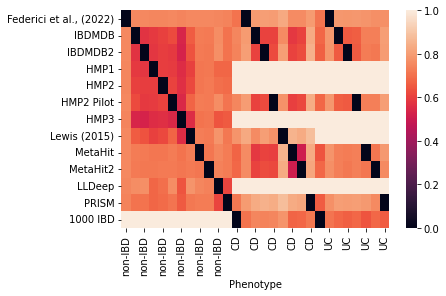

In [73]:
# network_labels = all_pheno.columns
# network_pal = sns.cubehelix_palette(network_labels.unique().size, light=.9, dark=.1, reverse=True, start=1, rot=-2)
# network_lut = dict(zip(map(str, network_labels.unique()), network_pal))

# network_colors = pd.Series(network_labels, index=all_pheno.columns).map(network_lut)

# node_labels = all_pheno.index
# node_pal = sns.cubehelix_palette(node_labels.unique().size)
# node_lut = dict(zip(map(str, node_labels.unique()), node_pal))

# node_colors = pd.Series(node_labels, index=all_pheno.columns).map(node_lut)

# node_labels

# lut = dict(zip(all_pheno.index.unique(), "qwertyuioplk"))
# col_colors = all_pheno.columns.map(lut)
sns.heatmap(all_pheno)

In [42]:


if TAXA_level == 'g':
    taxa_label = 'genus'
elif TAXA_level == 's':
    taxa_label = 'species'
else:
    taxa_label = 'OTU'

median_diversities_rounded = median_diversities.round(2)
display(median_diversities_rounded)
g = sns.clustermap(median_diversities_rounded, cmap=sns.color_palette("icefire", as_cmap=True), xticklabels=True, yticklabels=True)
plt.title(f'Median {metric.capitalize()} β-diversity Between Each Pair of {taxa_label} Tables')

for label in network_labels.unique():
    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label], label=label, linewidth=0)
g.ax_col_dendrogram.legend(title='Network', loc="center", ncol=5, bbox_to_anchor=(0.5, 1.2))

for label in node_labels.unique():
    g.ax_row_dendrogram.bar(0, 0, color=node_lut[label], label=label, linewidth=0)
g.ax_row_dendrogram.legend(title='Node', loc="center", ncol=2, bbox_to_anchor=(1.2, 0.5))

plt.show()

NameError: name 'TAXA_level' is not defined

<Figure size 12000x9600 with 0 Axes>

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al v.s. Federici et al., (2022): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.353e-186 U_stat=1.141e+08


,Federici et al,"Federici et al., (2022)"
Federici et al,0.86,0.89
"Federici et al., (2022)",0.89,0.82


,Federici et al,"Federici et al., (2022)"
Federici et al,0.86,0.89
"Federici et al., (2022)",0.89,0.82


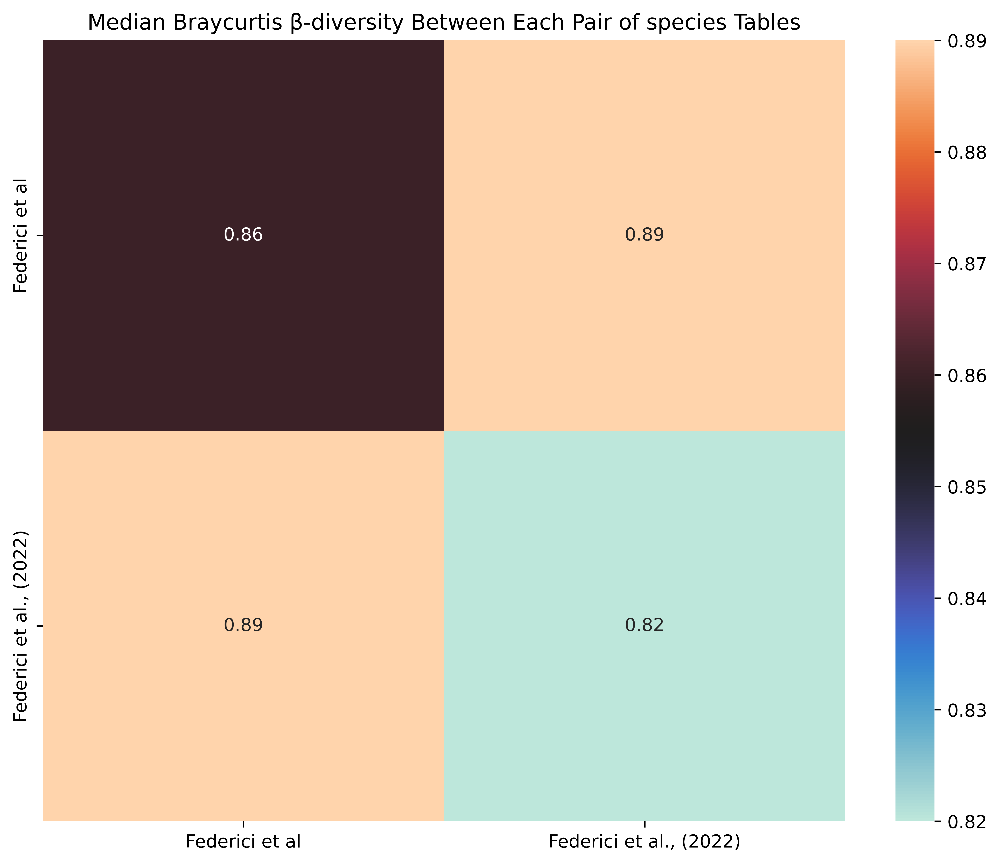

In [16]:
medians_dict = analysis.compute_median_diversities(df_list, "braycurtis", "s",0.1)

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al v.s. Federici et al., (2022): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=0.000e+00 U_stat=5.782e+07


,Federici et al,"Federici et al., (2022)"
Federici et al,0.14,0.1
"Federici et al., (2022)",0.10,0.2


,Federici et al,"Federici et al., (2022)"
Federici et al,0.14,0.1
"Federici et al., (2022)",0.1,0.2


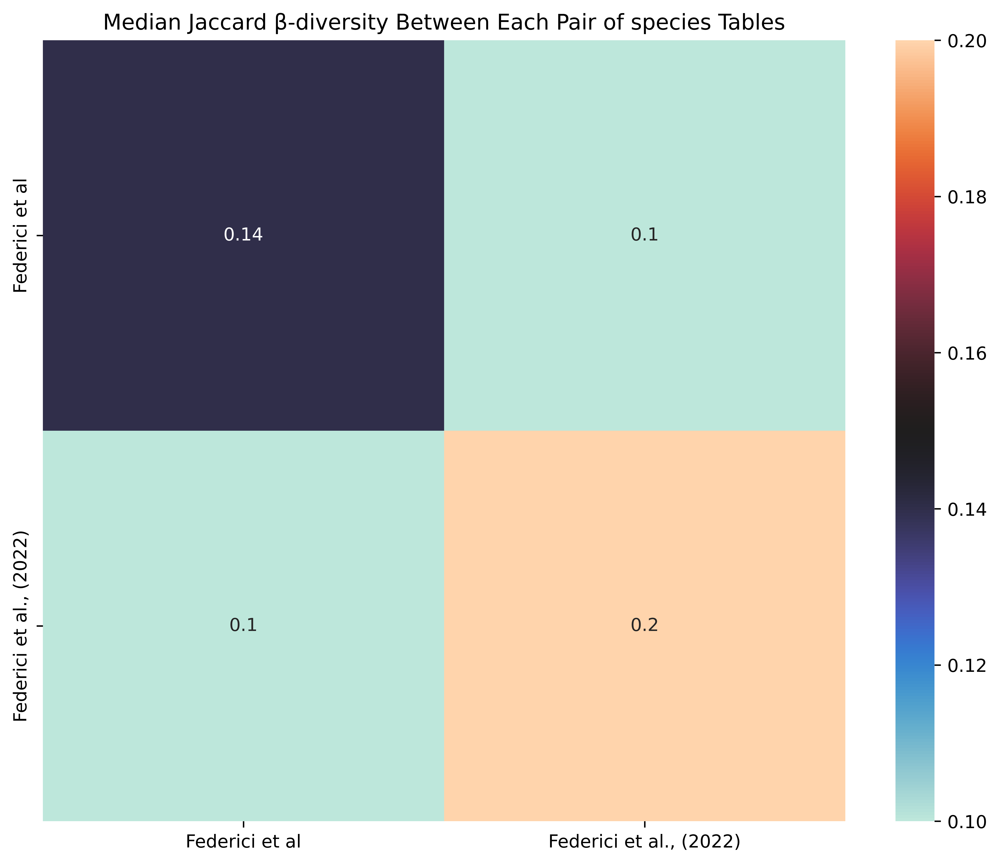

In [29]:
medians_dict = analysis.compute_median_diversities(df_list, "jaccard", "s", 0.1)

This section contains the genus-level braycurtis test summary.

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.159e-10 U_stat=4.479e+06
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.220e-02 U_stat=5.278e+04
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.558e-01 U_stat=1.425e+06
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.101e+07
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.073e-03 U_stat=5.177e+05
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.197e-13 U_stat=6.948e+05
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.752e-30 U_stat

,"Federici et al., (2022)",IBDMDB,IBDMDB2,HMP1,HMP2,HMP2 Pilot,HMP3,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM
"Federici et al., (2022)",0.70,0.75,0.75,0.75,0.75,0.75,0.74,0.75,0.75,0.75,0.75,0.74
IBDMDB,0.75,0.61,0.57,0.59,0.60,0.62,0.54,0.66,0.73,0.72,0.76,0.70
IBDMDB2,0.75,0.57,0.55,0.58,0.60,0.59,0.53,0.64,0.72,0.72,0.77,0.70
HMP1,0.75,0.59,0.58,0.58,0.59,0.59,0.56,0.60,0.71,0.72,0.68,0.68
HMP2,0.75,0.60,0.60,0.59,0.60,0.61,0.56,0.62,0.71,0.72,0.70,0.69
HMP2 Pilot,0.75,0.62,0.59,0.59,0.61,0.63,0.54,0.67,0.73,0.72,0.76,0.71
HMP3,0.74,0.54,0.53,0.56,0.56,0.54,0.53,0.56,0.71,0.71,0.64,0.65
Lewis (2015),0.75,0.66,0.64,0.60,0.62,0.67,0.56,0.69,0.73,0.72,0.78,0.72
MetaHit,0.75,0.73,0.72,0.71,0.71,0.73,0.71,0.73,0.66,0.71,0.75,0.72
MetaHit2,0.75,0.72,0.72,0.72,0.72,0.72,0.71,0.72,0.71,0.67,0.74,0.73


,"Federici et al., (2022)",HMP1,HMP2,HMP2 Pilot,HMP3,IBDMDB,IBDMDB2,LLDeep,Lewis (2015),MetaHit,MetaHit2,PRISM
"Federici et al., (2022)",0.7,0.75,0.75,0.75,0.74,0.75,0.75,0.75,0.75,0.75,0.75,0.74
HMP1,0.75,0.58,0.59,0.59,0.56,0.59,0.58,0.68,0.6,0.71,0.72,0.68
HMP2,0.75,0.59,0.6,0.61,0.56,0.6,0.6,0.7,0.62,0.71,0.72,0.69
HMP2 Pilot,0.75,0.59,0.61,0.63,0.54,0.62,0.59,0.76,0.67,0.73,0.72,0.71
HMP3,0.74,0.56,0.56,0.54,0.53,0.54,0.53,0.64,0.56,0.71,0.71,0.65
IBDMDB,0.75,0.59,0.6,0.62,0.54,0.61,0.57,0.76,0.66,0.73,0.72,0.7
IBDMDB2,0.75,0.58,0.6,0.59,0.53,0.57,0.55,0.77,0.64,0.72,0.72,0.7
LLDeep,0.75,0.68,0.7,0.76,0.64,0.76,0.77,0.53,0.78,0.75,0.74,0.61
Lewis (2015),0.75,0.6,0.62,0.67,0.56,0.66,0.64,0.78,0.69,0.73,0.72,0.72
MetaHit,0.75,0.71,0.71,0.73,0.71,0.73,0.72,0.75,0.73,0.66,0.71,0.72


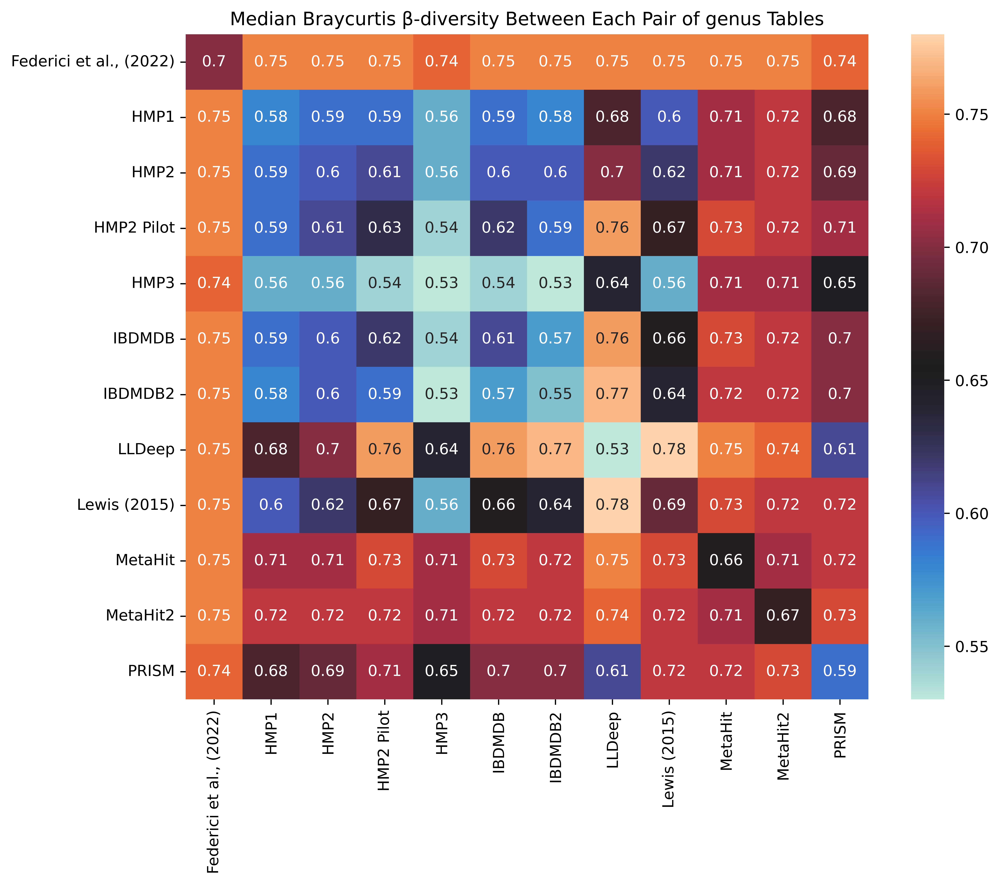

In [9]:
medians_dict = analysis.compute_median_diversities(df_list, "braycurtis", "g",0.1)

In [10]:
color_palette = {
    "1000 IBD": "#001219",
    "Federici et al., (2022)": "#005f73",
    "HMP1": "#0a9396",
    "HMP2": "#83c5be",
    "HMP2 Pilot": "#80B1D3",
    "HMP3": "#ee9b00",
    "IBDMDB": "#ca6702",
    "IBDMDB2": "#bb3e03",
    "Lewis (2015)": "#ae2012",
    "MetaHit": "#9b2226",
    "MetaHit2": "#e9d8a6",
    "LLDeep": "#335c67",
    "PRISM": "#38a3a5"
}
n_samples = disease_counts.loc[['nonIBD']].T.rename(columns={"nonIBD": "n_sample"})
beta_score = pd.DataFrame.from_dict(medians_dict, orient='index')

sample2beta = pd.concat([n_samples, beta_score], axis=1)
sample2beta.columns = ["n_sample", "beta_g_score"] if len(sample2beta.columns) == 2 else sample2beta.columns

sample2beta = sample2beta.dropna(subset=['beta_g_score'])
sample2beta = sample2beta.sort_values(by='n_sample', ascending=False)
sample2beta

,n_sample,beta_g_score
"Federici et al., (2022)",229,0.704727
MetaHit2,189,0.668476
HMP1,140,0.579249
MetaHit,99,0.660452
HMP2,93,0.596363
HMP3,89,0.527107
PRISM,34,0.591496
IBDMDB2,26,0.551322
Lewis (2015),26,0.685004
IBDMDB,24,0.608903


This section contains the species-level braycurtis test summary.

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.723e+06
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.726e-03 U_stat=5.318e+04
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.300e-02 U_stat=1.389e+06
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.136e+07
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.165e-01 U_stat=5.396e+05
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.864e-09 U_stat=6.683e+05
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.161e-20 U_stat

,"Federici et al., (2022)",IBDMDB,IBDMDB2,HMP1,HMP2,HMP2 Pilot,HMP3,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM
"Federici et al., (2022)",0.82,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.89,0.87,0.87
IBDMDB,0.88,0.81,0.80,0.82,0.82,0.83,0.78,0.86,0.88,0.88,0.88,0.84
IBDMDB2,0.88,0.80,0.76,0.82,0.81,0.81,0.77,0.84,0.88,0.88,0.87,0.83
HMP1,0.88,0.82,0.82,0.78,0.82,0.82,0.80,0.83,0.88,0.88,0.86,0.85
HMP2,0.88,0.82,0.81,0.82,0.78,0.82,0.79,0.83,0.88,0.88,0.87,0.85
HMP2 Pilot,0.88,0.83,0.81,0.82,0.82,0.81,0.78,0.86,0.88,0.88,0.88,0.84
HMP3,0.88,0.78,0.77,0.80,0.79,0.78,0.74,0.80,0.87,0.88,0.84,0.83
Lewis (2015),0.88,0.86,0.84,0.83,0.83,0.86,0.80,0.84,0.88,0.88,0.89,0.85
MetaHit,0.88,0.88,0.88,0.88,0.88,0.88,0.87,0.88,0.79,0.88,0.89,0.87
MetaHit2,0.89,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.80,0.89,0.88


,"Federici et al., (2022)",HMP1,HMP2,HMP2 Pilot,HMP3,IBDMDB,IBDMDB2,LLDeep,Lewis (2015),MetaHit,MetaHit2,PRISM
"Federici et al., (2022)",0.82,0.88,0.88,0.88,0.88,0.88,0.88,0.87,0.88,0.88,0.89,0.87
HMP1,0.88,0.78,0.82,0.82,0.8,0.82,0.82,0.86,0.83,0.88,0.88,0.85
HMP2,0.88,0.82,0.78,0.82,0.79,0.82,0.81,0.87,0.83,0.88,0.88,0.85
HMP2 Pilot,0.88,0.82,0.82,0.81,0.78,0.83,0.81,0.88,0.86,0.88,0.88,0.84
HMP3,0.88,0.8,0.79,0.78,0.74,0.78,0.77,0.84,0.8,0.87,0.88,0.83
IBDMDB,0.88,0.82,0.82,0.83,0.78,0.81,0.8,0.88,0.86,0.88,0.88,0.84
IBDMDB2,0.88,0.82,0.81,0.81,0.77,0.8,0.76,0.87,0.84,0.88,0.88,0.83
LLDeep,0.87,0.86,0.87,0.88,0.84,0.88,0.87,0.65,0.89,0.89,0.89,0.77
Lewis (2015),0.88,0.83,0.83,0.86,0.8,0.86,0.84,0.89,0.84,0.88,0.88,0.85
MetaHit,0.88,0.88,0.88,0.88,0.87,0.88,0.88,0.89,0.88,0.79,0.88,0.87


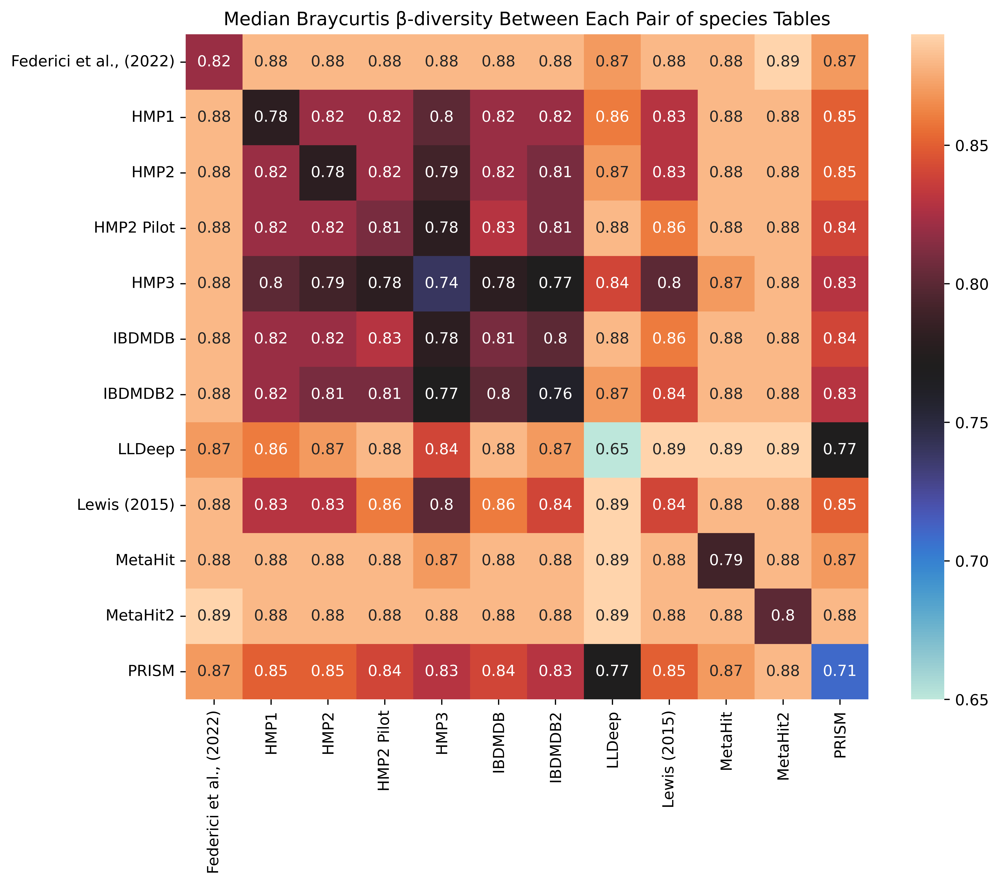

In [11]:
medians_dict = analysis.compute_median_diversities(df_list, "braycurtis", "s",0.1)

In [12]:
beta_score = pd.DataFrame.from_dict(medians_dict, orient='index')

samplebeta = pd.concat([beta_score], axis=1)
samplebeta.columns = ["beta_s_score"] if len(samplebeta.columns) == 1 else samplebeta.columns
samplebeta = samplebeta.dropna(subset=['beta_s_score'])
sample2beta = pd.concat([sample2beta, samplebeta], axis =1)

sample2beta

,n_sample,beta_g_score,beta_s_score
"Federici et al., (2022)",229,0.704727,0.817830
MetaHit2,189,0.668476,0.803171
HMP1,140,0.579249,0.784822
MetaHit,99,0.660452,0.794204
HMP2,93,0.596363,0.782022
HMP3,89,0.527107,0.742078
PRISM,34,0.591496,0.712324
IBDMDB2,26,0.551322,0.757539
Lewis (2015),26,0.685004,0.838920
IBDMDB,24,0.608903,0.805015


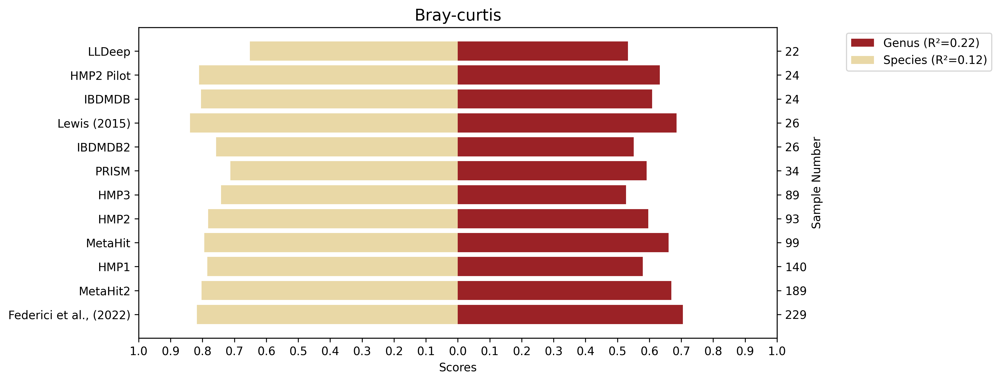

In [13]:
index = sample2beta.index
column0 = sample2beta['beta_g_score']
column1 = sample2beta['beta_s_score']
title0 = 'Genus'
title1 = 'Species'

# Linear regression model for beta_g_score
X = sm.add_constant(sample2beta['n_sample'])  # adding a constant
model_g = sm.OLS(sample2beta['beta_g_score'], X).fit()

# Linear regression model for beta_s_score
model_s = sm.OLS(sample2beta['beta_s_score'], X).fit()

# Creating the plot
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

# Plotting Genus and Species in the same chart
ax.barh(index, column0, align='center', color='#9b2226', zorder=10, label=f'{title0} (R²={model_g.rsquared:.2f})')
ax.barh(index, -column1, align='center', color='#e9d8a6', zorder=10, label=f'{title1} (R²={model_s.rsquared:.2f})')  # Inverting Species data

# Setting the main title for the figure
ax.set_title("Bray-curtis", fontsize=14)
# Setting axis titles
ax.set_xlabel("Scores", fontsize=10)  # x-axis title
# ax.set_ylabel("Cohorts", fontsize=10)   # Left y-axis title

# Setting the y-ticks on the left y-axis
ax.set(yticks=range(len(index)), yticklabels=index)

# Creating a twin y-axis to display the corresponding n_sample value for each index
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())  # Ensure the limits of both y-axes are the same
ax2.set_yticks(range(len(index)))
ax2.set_yticklabels(sample2beta['n_sample'].values)  # Set yticklabels to the n_sample values
ax2.set_ylabel("Sample Number", fontsize=10)  # Right y-axis title

# Inverting both y-axes to start from the top
plt.gca().invert_yaxis()
ax2.invert_yaxis()

# Moving the legend outside of the plot
ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1))

# Setting x-axis limits, tick parameters, and major formatter
ax.set_xlim(-1, 1)
ax.xaxis.set_tick_params(labelsize=10)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{abs(x):.1f}"))
ax.set_xticks([i * 0.1 for i in range(-10, 11)])

# Display the plot
plt.show()

This section contains the genus-level jaccard test summary.

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.979e-12 U_stat=4.536e+06
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.911e-07 U_stat=3.280e+04
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.696e-02 U_stat=1.769e+06
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.005e-03 U_stat=2.223e+07
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.284e-01 U_stat=6.620e+05
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.510e-02 U_stat=4.764e+05
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat

,"Federici et al., (2022)",IBDMDB,IBDMDB2,HMP1,HMP2,HMP2 Pilot,HMP3,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM
"Federici et al., (2022)",0.29,0.23,0.23,0.22,0.22,0.23,0.22,0.23,0.23,0.23,0.23,0.24
IBDMDB,0.23,0.25,0.32,0.26,0.27,0.29,0.26,0.25,0.25,0.26,0.24,0.27
IBDMDB2,0.23,0.32,0.31,0.27,0.28,0.32,0.28,0.28,0.26,0.26,0.25,0.28
HMP1,0.22,0.26,0.27,0.29,0.26,0.26,0.26,0.25,0.24,0.24,0.24,0.24
HMP2,0.22,0.27,0.28,0.26,0.28,0.27,0.26,0.25,0.24,0.24,0.23,0.24
HMP2 Pilot,0.23,0.29,0.32,0.26,0.27,0.26,0.26,0.25,0.25,0.26,0.24,0.27
HMP3,0.22,0.26,0.28,0.26,0.26,0.26,0.29,0.25,0.24,0.24,0.23,0.24
Lewis (2015),0.23,0.25,0.28,0.25,0.25,0.25,0.25,0.30,0.25,0.25,0.23,0.27
MetaHit,0.23,0.25,0.26,0.24,0.24,0.25,0.24,0.25,0.31,0.26,0.24,0.25
MetaHit2,0.23,0.26,0.26,0.24,0.24,0.26,0.24,0.25,0.26,0.30,0.25,0.25


,"Federici et al., (2022)",HMP1,HMP2,HMP2 Pilot,HMP3,IBDMDB,IBDMDB2,LLDeep,Lewis (2015),MetaHit,MetaHit2,PRISM
"Federici et al., (2022)",0.29,0.22,0.22,0.23,0.22,0.23,0.23,0.23,0.23,0.23,0.23,0.24
HMP1,0.22,0.29,0.26,0.26,0.26,0.26,0.27,0.24,0.25,0.24,0.24,0.24
HMP2,0.22,0.26,0.28,0.27,0.26,0.27,0.28,0.23,0.25,0.24,0.24,0.24
HMP2 Pilot,0.23,0.26,0.27,0.26,0.26,0.29,0.32,0.24,0.25,0.25,0.26,0.27
HMP3,0.22,0.26,0.26,0.26,0.29,0.26,0.28,0.23,0.25,0.24,0.24,0.24
IBDMDB,0.23,0.26,0.27,0.29,0.26,0.25,0.32,0.24,0.25,0.25,0.26,0.27
IBDMDB2,0.23,0.27,0.28,0.32,0.28,0.32,0.31,0.25,0.28,0.26,0.26,0.28
LLDeep,0.23,0.24,0.23,0.24,0.23,0.24,0.25,0.35,0.23,0.24,0.25,0.35
Lewis (2015),0.23,0.25,0.25,0.25,0.25,0.25,0.28,0.23,0.3,0.25,0.25,0.27
MetaHit,0.23,0.24,0.24,0.25,0.24,0.25,0.26,0.24,0.25,0.31,0.26,0.25


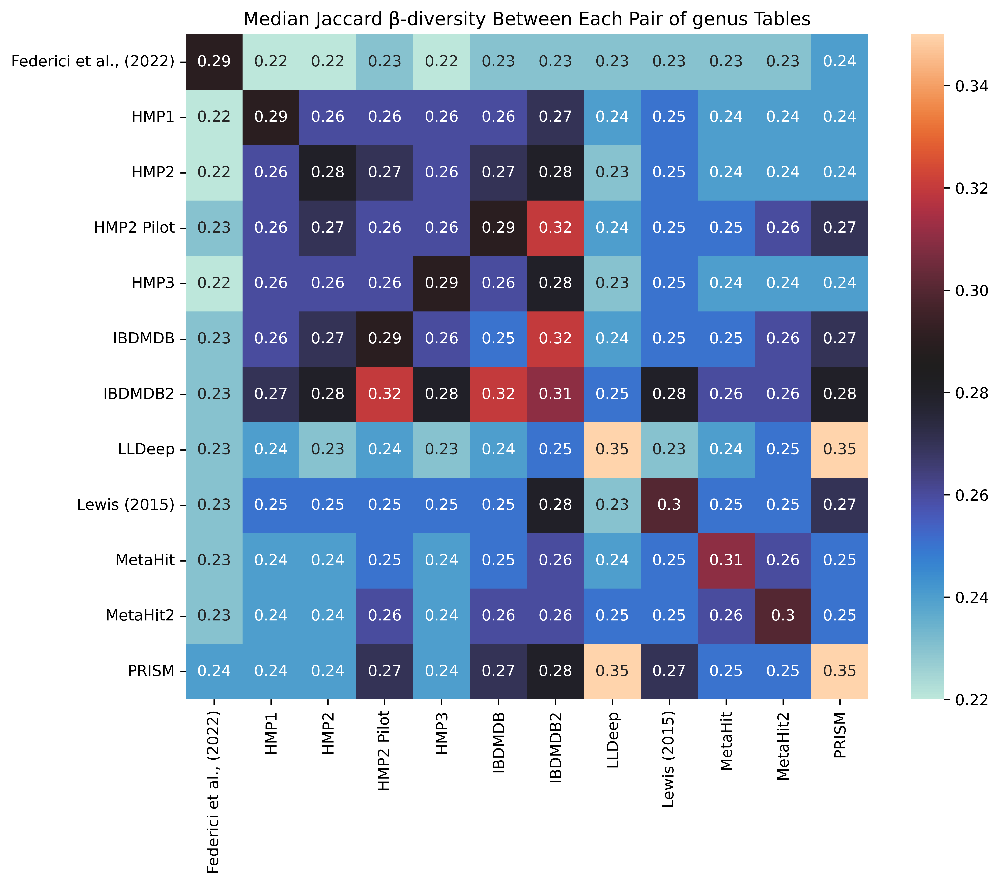

In [14]:
medians_dict = analysis.compute_median_diversities(df_list, "jaccard", "g", 0.1)

In [15]:
n_samples = disease_counts.loc[['nonIBD']].T.rename(columns={"nonIBD": "n_sample"})
beta_score = pd.DataFrame.from_dict(medians_dict, orient='index')

sample2beta = pd.concat([n_samples, beta_score], axis=1)
sample2beta.columns = ["n_sample", "beta_g_score"] if len(sample2beta.columns) == 2 else sample2beta.columns

sample2beta = sample2beta.dropna(subset=['beta_g_score'])
sample2beta = sample2beta.sort_values(by='n_sample', ascending=False)
sample2beta

,n_sample,beta_g_score
"Federici et al., (2022)",229,0.291667
MetaHit2,189,0.302692
HMP1,140,0.285714
MetaHit,99,0.311321
HMP2,93,0.280000
HMP3,89,0.287671
PRISM,34,0.351351
IBDMDB2,26,0.312500
Lewis (2015),26,0.300000
IBDMDB,24,0.253731


This section contains the species-level jaccard test summary.

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.712e-07 U_stat=4.352e+06
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.086e-05 U_stat=3.456e+04
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.679e+06
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.392e-09 U_stat=2.272e+07
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.017e-01 U_stat=6.672e+05
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.247e-02 U_stat=4.708e+05
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat

,"Federici et al., (2022)",IBDMDB,IBDMDB2,HMP1,HMP2,HMP2 Pilot,HMP3,Lewis (2015),MetaHit,MetaHit2,LLDeep,PRISM
"Federici et al., (2022)",0.20,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.10,0.11,0.11
IBDMDB,0.11,0.17,0.18,0.16,0.17,0.16,0.17,0.14,0.12,0.12,0.11,0.14
IBDMDB2,0.11,0.18,0.21,0.17,0.17,0.17,0.18,0.16,0.12,0.12,0.11,0.14
HMP1,0.11,0.16,0.17,0.20,0.17,0.16,0.17,0.16,0.12,0.12,0.14,0.14
HMP2,0.11,0.17,0.17,0.17,0.19,0.17,0.17,0.16,0.12,0.12,0.13,0.14
HMP2 Pilot,0.11,0.16,0.17,0.16,0.17,0.17,0.17,0.14,0.12,0.12,0.11,0.14
HMP3,0.11,0.17,0.18,0.17,0.17,0.17,0.20,0.16,0.12,0.12,0.14,0.14
Lewis (2015),0.11,0.14,0.16,0.16,0.16,0.14,0.16,0.20,0.11,0.12,0.11,0.14
MetaHit,0.11,0.12,0.12,0.12,0.12,0.12,0.12,0.11,0.22,0.12,0.11,0.11
MetaHit2,0.10,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.22,0.11,0.11


,"Federici et al., (2022)",HMP1,HMP2,HMP2 Pilot,HMP3,IBDMDB,IBDMDB2,LLDeep,Lewis (2015),MetaHit,MetaHit2,PRISM
"Federici et al., (2022)",0.2,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.1,0.11
HMP1,0.11,0.2,0.17,0.16,0.17,0.16,0.17,0.14,0.16,0.12,0.12,0.14
HMP2,0.11,0.17,0.19,0.17,0.17,0.17,0.17,0.13,0.16,0.12,0.12,0.14
HMP2 Pilot,0.11,0.16,0.17,0.17,0.17,0.16,0.17,0.11,0.14,0.12,0.12,0.14
HMP3,0.11,0.17,0.17,0.17,0.2,0.17,0.18,0.14,0.16,0.12,0.12,0.14
IBDMDB,0.11,0.16,0.17,0.16,0.17,0.17,0.18,0.11,0.14,0.12,0.12,0.14
IBDMDB2,0.11,0.17,0.17,0.17,0.18,0.18,0.21,0.11,0.16,0.12,0.12,0.14
LLDeep,0.11,0.14,0.13,0.11,0.14,0.11,0.11,0.29,0.11,0.11,0.11,0.19
Lewis (2015),0.11,0.16,0.16,0.14,0.16,0.14,0.16,0.11,0.2,0.11,0.12,0.14
MetaHit,0.11,0.12,0.12,0.12,0.12,0.12,0.12,0.11,0.11,0.22,0.12,0.11


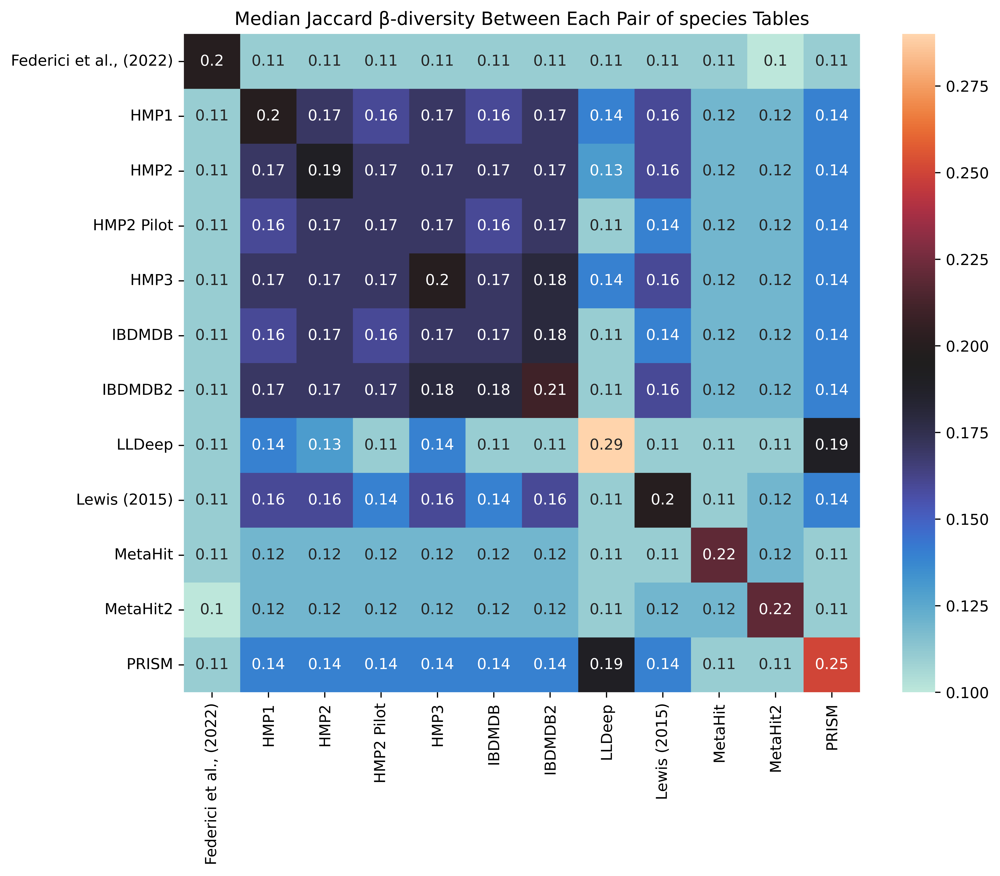

In [16]:
medians_dict = analysis.compute_median_diversities(df_list, "jaccard", "s", 0.1)

In [17]:
beta_score = pd.DataFrame.from_dict(medians_dict, orient='index')

samplebeta = pd.concat([beta_score], axis=1)
samplebeta.columns = ["beta_s_score"] if len(samplebeta.columns) == 1 else samplebeta.columns
samplebeta = samplebeta.dropna(subset=['beta_s_score'])
sample2beta = pd.concat([sample2beta, samplebeta], axis =1)

sample2beta

,n_sample,beta_g_score,beta_s_score
"Federici et al., (2022)",229,0.291667,0.195946
MetaHit2,189,0.302692,0.219388
HMP1,140,0.285714,0.198020
MetaHit,99,0.311321,0.221557
HMP2,93,0.280000,0.190476
HMP3,89,0.287671,0.198237
PRISM,34,0.351351,0.252252
IBDMDB2,26,0.312500,0.213483
Lewis (2015),26,0.300000,0.200000
IBDMDB,24,0.253731,0.168939


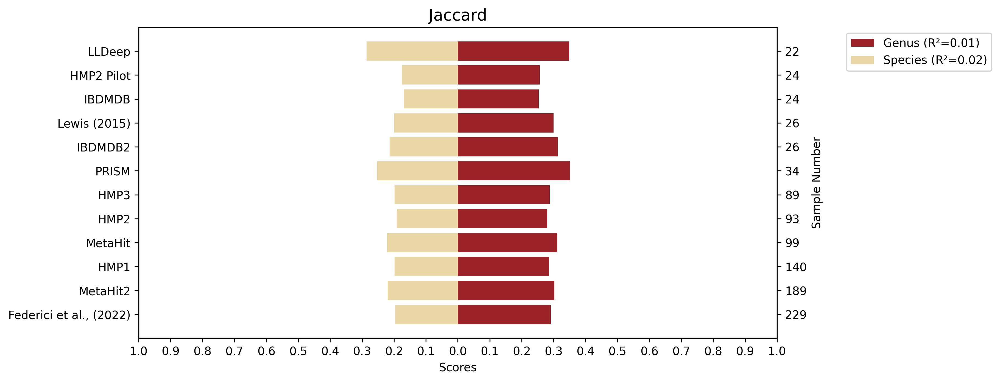

In [18]:
index = sample2beta.index
column0 = sample2beta['beta_g_score']
column1 = sample2beta['beta_s_score']
title0 = 'Genus'
title1 = 'Species'

# Linear regression model for beta_g_score
X = sm.add_constant(sample2beta['n_sample'])  # adding a constant
model_g = sm.OLS(sample2beta['beta_g_score'], X).fit()

# Linear regression model for beta_s_score
model_s = sm.OLS(sample2beta['beta_s_score'], X).fit()

# Creating the plot
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

# Plotting Genus and Species in the same chart
ax.barh(index, column0, align='center', color='#9b2226', zorder=10, label=f'{title0} (R²={model_g.rsquared:.2f})')
ax.barh(index, -column1, align='center', color='#e9d8a6', zorder=10, label=f'{title1} (R²={model_s.rsquared:.2f})')  # Inverting Species data

# Setting the main title for the figure
ax.set_title("Jaccard", fontsize=14)
# Setting axis titles
ax.set_xlabel("Scores", fontsize=10)  # x-axis title
# ax.set_ylabel("Cohorts", fontsize=10)   # Left y-axis title

# Setting the y-ticks on the left y-axis
ax.set(yticks=range(len(index)), yticklabels=index)

# Creating a twin y-axis to display the corresponding n_sample value for each index
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())  # Ensure the limits of both y-axes are the same
ax2.set_yticks(range(len(index)))
ax2.set_yticklabels(sample2beta['n_sample'].values)  # Set yticklabels to the n_sample values
ax2.set_ylabel("Sample Number", fontsize=10)  # Right y-axis title

# Inverting both y-axes to start from the top
plt.gca().invert_yaxis()
ax2.invert_yaxis()

# Moving the legend outside of the plot
ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1))

# Setting x-axis limits, tick parameters, and major formatter
ax.set_xlim(-1, 1)
ax.xaxis.set_tick_params(labelsize=10)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{abs(x):.1f}"))
ax.set_xticks([i * 0.1 for i in range(-10, 11)])

# Display the plot
plt.show()

In [27]:
analysis.compute_alpha_diversities(df_list, 'g', 0.01 )

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.327e-09 U_stat=5.014e+03
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.340e+02
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.646e+03
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.466e+03
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.236e+03
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.590e+02
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.655e-10 U_stat=5.070e+03
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.795e+02
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.811e-01 U_stat=1.146e+03
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.138e+03
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.848e-01 U_stat=1.576e+03
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.275e+02
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.354e-08 U_stat=4.848e+03
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.410e+02
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.754e+03
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.514e+03
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.151e+03
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.860e+02
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat

In [ ]:
txt = ('''Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.050e-06 U_stat=4.980e+02
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.430e+02
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.102e+03
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.521e+03
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.156e+03
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.760e+02
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.760e+02
Lewis (2015) v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.069e-05 U_stat=4.370e+02
MetaHit v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.035e+04
Federici et al., (2022) v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.949e-06 U_stat=5.260e+02
IBDMDB v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.731e+03
IBDMDB2 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.441e+03
HMP1 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.643e+03
HMP2 v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.961e+03
HMP2 Pilot v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.040e+02
HMP3 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.775e-16 U_stat=1.188e+03
Lewis (2015) v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.866e-05 U_stat=9.510e+02
Federici et al., (2022) v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.042e-10 U_stat=2.849e+03
IBDMDB v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.095e+03
IBDMDB2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.810e+02
HMP1 v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.812e+03
HMP2 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.940e+02
HMP2 Pilot v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.592e-07 U_stat=2.750e+02
HMP3 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.176e-19 U_stat=2.422e+03
Federici et al., (2022) v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.964e-10 U_stat=1.936e+03
IBDMDB v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.900e+02
IBDMDB2 v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.295e+03
HMP1 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.349e+03
HMP2 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.099e-17 U_stat=1.165e+03
HMP2 Pilot v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.819e-08 U_stat=5.330e+02
Federici et al., (2022) v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.050e-06 U_stat=4.980e+02
IBDMDB v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.800e+02
IBDMDB2 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.210e+02
HMP1 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.315e-20 U_stat=1.885e+03
HMP2 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.850e-22 U_stat=2.388e+03
Federici et al., (2022) v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.049e-09 U_stat=1.775e+03
IBDMDB v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.040e+02
IBDMDB2 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.786e-06 U_stat=4.310e+02
HMP1 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.153e-27 U_stat=3.779e+03
Federici et al., (2022) v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.321e-06 U_stat=5.280e+02
IBDMDB v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.835e-07 U_stat=2.660e+02
IBDMDB2 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.999e-06 U_stat=9.160e+02
Federici et al., (2022) v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.113e+03
IBDMDB v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.384e-08 U_stat=5.170e+02
Federici et al., (2022) v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.441e+03''')

This section contains the genus-level test summary.

In [ ]:
annotated_pval_heatmap(txt)

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
txt= ('''Federici et al., (2022) v.s. IBDMDB: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.742e-07 U_stat=5.040e+02
IBDMDB v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.620e+02
IBDMDB2 v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.892e+03
HMP1 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.566e+03
HMP2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.298e+03
HMP2 Pilot v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.400e+02
HMP3 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.095e+03
Lewis (2015) v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.400e-07 U_stat=3.270e+02
MetaHit v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.058e+04
Federici et al., (2022) v.s. IBDMDB2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.430e-06 U_stat=5.320e+02
IBDMDB v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.552e+03
IBDMDB2 v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.274e+03
HMP1 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.890e+03
HMP2 v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.890e+03
HMP2 Pilot v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.330e+02
HMP3 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.074e-16 U_stat=1.105e+03
Lewis (2015) v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.535e-07 U_stat=7.400e+02
Federici et al., (2022) v.s. HMP1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.611e-11 U_stat=2.885e+03
IBDMDB v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.860e+02
IBDMDB2 v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.710e+02
HMP1 v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.749e+03
HMP2 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.106e+03
HMP2 Pilot v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.376e-08 U_stat=2.010e+02
HMP3 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.525e-19 U_stat=2.399e+03
Federici et al., (2022) v.s. HMP2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.792e-11 U_stat=1.962e+03
IBDMDB v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.920e+02
IBDMDB2 v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.130e+03
HMP1 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.660e+03
HMP2 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.957e-19 U_stat=1.026e+03
HMP2 Pilot v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.791e-09 U_stat=3.890e+02
Federici et al., (2022) v.s. HMP2 Pilot: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.742e-07 U_stat=5.040e+02
IBDMDB v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.820e+02
IBDMDB2 v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.260e+02
HMP1 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.331e-22 U_stat=1.627e+03
HMP2 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.252e-23 U_stat=2.222e+03
Federici et al., (2022) v.s. HMP3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.296e-09 U_stat=1.771e+03
IBDMDB v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.550e+02
IBDMDB2 v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.074e-07 U_stat=3.230e+02
HMP1 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.563e-28 U_stat=3.528e+03
Federici et al., (2022) v.s. Lewis (2015): Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.683e-07 U_stat=5.410e+02
IBDMDB v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.760e-08 U_stat=2.070e+02
IBDMDB2 v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.837e-07 U_stat=7.290e+02
Federici et al., (2022) v.s. MetaHit: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.214e+03
IBDMDB v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.385e-09 U_stat=4.160e+02
Federici et al., (2022) v.s. MetaHit2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.544e-01 U_stat=2.687e+03''')

This section contains the species-level test summary.

In [ ]:
annotated_pval_heatmap(txt)

In [ ]:
index = ['Sex', 'Age', 'BMI', 'Race', 'Center', 'Country']
summray_features = pd.DataFrame(index = index)

# calculate Sex col miss values each project
summray_features.loc["Sex", "Eran_Elinav"] = Eran_Elinav[Eran_Elinav["Disease"] == 'nonIBD']["Gender"].isnull().mean() * 100
summray_features.loc["Sex", "HMP1"] = HMP1["host_sex"].isnull().mean() * 100
summray_features.loc["Sex","HMP2"] = HMP2["host_sex"].isnull().mean() * 100
summray_features.loc["Sex", "HMP2_pilot"] = HMP2_pilot[(HMP2_pilot["diagnosis"] == 'nonIBD') & (HMP2_pilot["data_type"] == 'metagenomics')]["sex"].isnull().mean() * 100
summray_features.loc["Sex","HMP3"] = np.nan
summray_features.loc["Sex","IBDMDB"] = ibdmdb[(ibdmdb["diagnosis"] == 'nonIBD') & (ibdmdb["data_type"] == 'metagenomics')]["sex"].isnull().mean() * 100
summray_features.loc["Sex", "IBDMDB2"] = ibdmdb2[(ibdmdb2["diagnosis"] == 'nonIBD') & (ibdmdb2["data_type"] == 'metagenomics')]["sex"].isnull().mean() * 100
summray_features.loc["Sex", "MetaHit"] = MetaHit[MetaHit["diagnosis"] == 'nonIBD']["Gender"].isnull().mean() * 100
summray_features.loc["Sex", "Lewis"] = np.nan

# calculate Age col miss values each project
summray_features.loc["Age", "Eran_Elinav"] = Eran_Elinav[Eran_Elinav["Disease"] == 'nonIBD']["Age"].isnull().mean() * 100
summray_features.loc["Age", "HMP1"] = np.nan
summray_features.loc["Age","HMP2"] = np.nan
summray_features.loc["Age", "HMP2_pilot"] = HMP2_pilot[(HMP2_pilot["diagnosis"] == 'nonIBD') & (HMP2_pilot["data_type"] == 'metagenomics')]["consent_age"].isnull().mean() * 100
summray_features.loc["Age","HMP3"] = np.nan
summray_features.loc["Age","IBDMDB"] = ibdmdb[(ibdmdb["diagnosis"] == 'nonIBD') & (ibdmdb["data_type"] == 'metagenomics')]["age_at_consent"].isnull().mean() * 100
summray_features.loc["Age", "IBDMDB2"] = ibdmdb2[(ibdmdb2["diagnosis"] == 'nonIBD') & (ibdmdb2["data_type"] == 'metagenomics')]["consent_age"].isnull().mean() * 100
summray_features.loc["Age", "MetaHit"] = MetaHit[MetaHit["diagnosis"] == 'nonIBD']["Age"].isnull().mean() * 100
summray_features.loc["Age", "Lewis"] = np.nan

# calculate BMI col miss values each project
summray_features.loc["BMI", "Eran_Elinav"] = np.nan
summray_features.loc["BMI", "HMP1"] = np.nan
summray_features.loc["BMI","HMP2"] = np.nan
summray_features.loc["BMI", "HMP2_pilot"] = HMP2_pilot[(HMP2_pilot["diagnosis"] == 'nonIBD') & (HMP2_pilot["data_type"] == 'metagenomics')]["BMI"].isnull().mean() * 100
summray_features.loc["BMI","HMP3"] = np.nan
summray_features.loc["BMI","IBDMDB"] = np.nan
summray_features.loc["BMI", "IBDMDB2"] = ibdmdb2[(ibdmdb2["diagnosis"] == 'nonIBD') & (ibdmdb2["data_type"] == 'metagenomics')]["BMI"].isnull().mean() * 100
summray_features.loc["BMI", "MetaHit"] = MetaHit[MetaHit["diagnosis"] == 'nonIBD']["BMI"].isnull().mean() * 100
summray_features.loc["BMI", "Lewis"] = np.nan

# calculate Race col miss values each project
summray_features.loc["Race", "Eran_Elinav"] = np.nan
summray_features.loc["Race", "HMP1"] = np.nan
summray_features.loc["Race","HMP2"] = np.nan
summray_features.loc["Race", "HMP2_pilot"] = HMP2_pilot[(HMP2_pilot["diagnosis"] == 'nonIBD') & (HMP2_pilot["data_type"] == 'metagenomics')]["Specify race"].isnull().mean() * 100
summray_features.loc["Race","HMP3"] = np.nan
summray_features.loc["Race","IBDMDB"] = ibdmdb[(ibdmdb["diagnosis"] == 'nonIBD') & (ibdmdb["data_type"] == 'metagenomics')]["specify_race"].isnull().mean() * 100
summray_features.loc["Race", "IBDMDB2"] = ibdmdb2[(ibdmdb2["diagnosis"] == 'nonIBD') & (ibdmdb2["data_type"] == 'metagenomics')]["Specify race"].isnull().mean() * 100
summray_features.loc["Race", "MetaHit"] = MetaHit[MetaHit["diagnosis"] == 'nonIBD']["BMI"].isnull().mean() * 100
summray_features.loc["Race", "Lewis"] = np.nan

# calculate Center col miss values each project
summray_features.loc["Center", "Eran_Elinav"] = np.nan
summray_features.loc["Center", "HMP1"] = np.nan
summray_features.loc["Center","HMP2"] = np.nan
summray_features.loc["Center", "HMP2_pilot"] = HMP2_pilot[(HMP2_pilot["diagnosis"] == 'nonIBD') & (HMP2_pilot["data_type"] == 'metagenomics')]["site_name"].isnull().mean() * 100
summray_features.loc["Center","HMP3"] = np.nan
summray_features.loc["Center","IBDMDB"] = ibdmdb[(ibdmdb["diagnosis"] == 'nonIBD') & (ibdmdb["data_type"] == 'metagenomics')]["SiteName"].isnull().mean() * 100
summray_features.loc["Center", "IBDMDB2"] = ibdmdb2[(ibdmdb2["diagnosis"] == 'nonIBD') & (ibdmdb2["data_type"] == 'metagenomics')]["site_name"].isnull().mean() * 100
summray_features.loc["Center", "MetaHit"] = np.nan
summray_features.loc["Center", "Lewis"] = np.nan

# calculate Country col miss values each project
summray_features.loc["Country", "Eran_Elinav"] = Eran_Elinav[Eran_Elinav["Disease"] == 'nonIBD']["Cohort"].isnull().mean() * 100
summray_features.loc["Country", "HMP1"] = np.nan
summray_features.loc["Country","HMP2"] = np.nan
summray_features.loc["Country", "HMP2_pilot"] = np.nan
summray_features.loc["Country","HMP3"] = np.nan
summray_features.loc["Country","IBDMDB"] = np.nan
summray_features.loc["Country", "IBDMDB2"] = np.nan
summray_features.loc["Country", "MetaHit"] = MetaHit[MetaHit["diagnosis"] == 'nonIBD']["Country"].isnull().mean() * 100
summray_features.loc["Country", "Lewis"] = np.nan

summray_features.round(2)

This table display the percent of missing each feature

In [ ]:
def filter_dataframes(main_df: pd.DataFrame, secondary_df: pd.DataFrame, cohorts: list, filter_value: str, cohort_col: str, filter_col: str, value_col: str) -> list:
    """
    Filter the main dataframe based on cohort_col and filter_col and retrieve corresponding data from the secondary dataframe using values from value_col.
    Returns:
    - list: List of tuples (cohort_value, filtered_secondary_df).
    """
    output = []
    for cohort in cohorts:
        # Filter main DataFrame based on cohort_col and filter_col, and get value_col values
        cohort_df = main_df[main_df[cohort_col] == cohort]
        values = cohort_df.loc[cohort_df[filter_col] == filter_value, value_col].values
        
        # Filter secondary DataFrame using the values
        filtered_secondary_df = secondary_df.loc[secondary_df.index.intersection(values)]
        
        output.append((cohort, filtered_secondary_df))
    
    return output

In [ ]:
cohorts_list = [ 'Israel','France', 'US','Germany']
df_list = filter_dataframes(Eran_Elinav, Eran_Elinav_T, cohorts_list, 'nonIBD', 'Cohort', 'Disease', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
analysis.compute_median_diversities(df_list, "braycurtis", "s")

In [ ]:
cohorts_list = ['Denmark', 'Spain']
df_list = filter_dataframes(MetaHit, MetaHit_T, cohorts_list, 'nonIBD', 'Country', 'diagnosis', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
bins = [20, 30, 40, 50]  # Adjust as needed
labels = [ '20-30', '30-40', '40-50']
MetaHit2['age_group'] = pd.cut(MetaHit2['Age'], bins=bins, labels=labels, right=False)

cohorts_list = labels
df_list = filter_dataframes(MetaHit2, MetaHit2_T, cohorts_list, 'CD', 'age_group', 'Health Status', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
bins = [20, 30, 40, 50, 60, 70, 80]  # Adjust as needed
labels = [ '20-30', '30-40', '40-50', '50-60','60-70','70-80']
MetaHit['age_group'] = pd.cut(MetaHit['Age'], bins=bins, labels=labels, right=False)

cohorts_list = labels
df_list = filter_dataframes(MetaHit, MetaHit_T, cohorts_list, 'IBD', 'age_group', 'diagnosis', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
MetaHit2['thresh'] = "all"
bins = [20, 30, 40, 50, 60, 70, 80]  # Adjust as needed
labels = [ '20-30', '30-40', '40-50', '50-60','60-70','70-80']
MetaHit['age_group'] = pd.cut(MetaHit['Age'], bins=bins, labels=labels, right=False)

cohorts_list = ['nonIBD', 'CD', 'UC']
df_list = filter_dataframes(MetaHit2, MetaHit2_T, cohorts_list, 'all', 'Health Status', 'thresh', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

### Childrens cohorts
- Cincinnati
- MGH Pediatrics
- Emory

### Adults cohorts
- MGH
- Cedars-Sinai
**Source:** Cincinnati Children’s Hospital, Massachusetts General Hospital (MGH) Pediatrics, and Emory University Hospital; and two adult cohorts: MGH and Cedars-Sinai Medical Center.

In [ ]:
ibdmdb2['site_name'].value_counts()

In [ ]:
# 1. Create three DataFrames based on the site column in ibdmdb2 
cohorts_list = ['Cincinnati', 'MGH', 'Cedars-Sinai','MGH Pediatrics', 'Emory'] 
df_list = filter_dataframes(ibdmdb2, ibdmdb2_T, cohorts_list, 'nonIBD', 'site_name', 'diagnosis', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
HMP2_pilot['site_name'].value_counts()

In [ ]:
# 1. Create three DataFrames based on the site column in HMP2_pilot
cohorts_list = ['Cincinnati', 'MGH', 'Cedars-Sinai','MGH Pediatrics', 'Emory'] 
df_list = filter_dataframes(HMP2_pilot, HMP2_pilot_T, cohorts_list, 'nonIBD', 'site_name', 'diagnosis', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

In [ ]:
ibdmdb['SiteName'].replace({"Massachusetts General Hospital": "MGH"}, inplace = True)
ibdmdb['SiteName'].value_counts()

In [ ]:
# 1. Create three DataFrames based on the site column in ibdmdb
cohorts_list = ['MGH', 'Cincinnati', 'Cedars-Sinai','MGH Pediatrics', 'Emory'] 
df_list = filter_dataframes(ibdmdb, ibdmdb_T, cohorts_list, 'nonIBD', 'SiteName', 'diagnosis', 'index')

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

**Childrens**

In [ ]:
def filter_dataframe_by_sites(main_df, column_name, target_df, col2index):
    main_df = main_df.set_index(col2index)
    # Get the rows from the main dataframe where the site matches our criteria
    filtered_main = main_df[main_df[column_name].isin(['Cincinnati', 'MGH Pediatrics'])]
    filtered_index = filtered_main.index
    return target_df.loc[target_df.index.intersection(filtered_index)]

df_list = [
    ("ibdmdb", filter_dataframe_by_sites(ibdmdb, 'SiteName', ibdmdb_C, 'index')),
    ("ibdmdb2", filter_dataframe_by_sites(ibdmdb2, 'site_name', ibdmdb2_C, 'index')),
    ("HMP2 pilot", filter_dataframe_by_sites(HMP2_pilot, 'site_name', HMP2_pilot_C, 'index')),
    ("Lewis", Lewis_C)  # Assuming no filtering is required for Lewis_C
]

In [ ]:
df_list = [("ibdmdb", ibdmdb_C), ("ibdmdb2", ibdmdb2_C),("HMP2 pilot", HMP2_pilot_C), ("Lewis", Lewis_C)]

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')

**Adults**

In [ ]:
def filter_dataframe_by_sites(main_df, column_name, target_df, col2index):
    main_df = main_df.set_index(col2index)
    # Get the rows from the main dataframe where the site matches our criteria
    filtered_main = main_df[main_df[column_name].isin(['Cedars-Sinai', 'MGH'])]
    filtered_index = filtered_main.index
    return target_df.loc[target_df.index.intersection(filtered_index)]

df_list = [
    ("ibdmdb", filter_dataframe_by_sites(ibdmdb, 'SiteName', ibdmdb_C, 'External ID')),
    ("ibdmdb2", filter_dataframe_by_sites(ibdmdb2, 'site_name', ibdmdb2_C, 'External ID')),
    ("HMP2 pilot", filter_dataframe_by_sites(HMP2_pilot, 'site_name', HMP2_pilot_C, 'External ID')),
    ("Lewis", Lewis_C)
]

In [ ]:
analysis.compute_alpha_diversities(df_list, 'g')

In [ ]:
analysis.compute_alpha_diversities(df_list, 's')